# Projeto Fundamentos da Ciência dos Dados: Visão Geral das Taxas de Suicídio de 1985 a 2016


Realizado por:
- João Cajado
- Henrique Alves

## Introdução

Durante a execução deste trabalho, pretendemos recorrer aos conteúdos de manipulação, exploração, representação visual e algoritmos de machine learning, abordados ao longo da unidade curricular de Fundamentos da Ciência dos Dados (FCD).

Este trabalho vai ter a seguinte estrutura:

1- Definição do Problema;

2- Aquisição dos Dados;

3- Data Wrangling;

4- Exploratory Data Analysis (EDA);

5- Modelagem preditiva com recurso a algoritmos de machine learning.


### 1 - Definição do Problema


O suicídio é um fenómeno dramático e complexo que afeta pessoas de todas as idades, culturas e regiões do mundo. As taxas de suicídio têm sido objeto de estudo e preocupação crescente, devido ao impacto devastador que têm na sociedade. A análise dos dados proveniente dessas mesmas taxas torna-se fundamental para a adoção de medidas de prevenção.

A investigação aprofundada das taxas de suicídio é crucial para a implementação de políticas de saúde pública mais eficazes, a criação de programas de apoio e prevenção adequados, e para promover uma consciencialização ampla sobre questões de saúde mental em todo o mundo. 

Este projeto tem como foco principal a análise abrangente das taxas de suicídio em todo o mundo. O objetivo é compreender as tendências, correlações, fatores e implicações associadas. O suicídio é uma questão de saúde pública de grande relevância, e a análise de dados nesse contexto pode fornecer perceções valiosas. 

A disponibilidade de um conjunto de dados que inclui indicadores socioeconómicos, como o Índice de Desenvolvimento Humano (HDI) e o Produto Interno Bruto (PIB), oferece uma oportunidade única para identificar correlações e padrões subjacentes.

Estes objetivos são orientados para abordar questões de pesquisa específicas e fornecer uma análise aprofundada das taxas de suicídio e fatores associados. Esperamos que este projeto seja uma contribuição valiosa para a compreensão e abordagem de questões de saúde mental globalmente.  

### 2 - Aquisição dos Dados

Os dados analisados no desenvolvimento deste projeto terão como fonte um dataset com as taxas de suicídio a nível global, de 1985 a 2016, retirado da plataforma Kaggle, em https://www.kaggle.com/datasets/russellyates88/suicide-rates-overview-1985-to-2016.

### 3 - Data Wrangling


Importar todas as bibliotecas que vamos utilizar ao longo do projeto.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
import warnings
import pycountry
import math
import mplleaflet
import folium
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

%matplotlib inline

#### 3.1 - Ler os dados

Na fase inicial, procedemos à importação do ficheiro "master.csv" para o notebook, este será o dataset que servirá como fonte dos dados a analisar neste projeto. Posteriormente definimos o nosso dataframe como ´df´.

In [2]:
# Ler o ficheiro CSV e armazenar o mesmo num DataFrame chamado 'df'
df = pd.read_csv('./master.csv')

# Mostrar as primeiras 5 linhas do DataFrame 'df'
df.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


In [3]:
# Renomear as colunas 'gdp_for_year ($)' e 'gdp_per_capita ($)'
df.rename(columns={" gdp_for_year ($) ":
                  "gdp_for_year", "gdp_per_capita ($)":
                  "gdp_per_capita"}, inplace=True)

# Mostrar as primeiras 5 linhas do DataFrame 'df' para verificar se os nomes das colunas foram alterados
df.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year,gdp_per_capita,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


#### 3.2 - Ver o resumo do DataFrame

Antes de fazer qualquer análise exploratória com base neste dataframe, é fundamental ter conhecimento prévio da sua estrutura, tipo de dados e informação estatística.

In [4]:
# Mostrar informações sobre o DataFrame 'df' (nome das colunas, tipos de dados, etc)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27820 entries, 0 to 27819
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   country            27820 non-null  object 
 1   year               27820 non-null  int64  
 2   sex                27820 non-null  object 
 3   age                27820 non-null  object 
 4   suicides_no        27820 non-null  int64  
 5   population         27820 non-null  int64  
 6   suicides/100k pop  27820 non-null  float64
 7   country-year       27820 non-null  object 
 8   HDI for year       8364 non-null   float64
 9   gdp_for_year       27820 non-null  object 
 10  gdp_per_capita     27820 non-null  int64  
 11  generation         27820 non-null  object 
dtypes: float64(2), int64(4), object(6)
memory usage: 2.5+ MB


In [5]:
# Mostra o nome de todas as colunas do DataFrame 'df'
df.columns

Index(['country', 'year', 'sex', 'age', 'suicides_no', 'population',
       'suicides/100k pop', 'country-year', 'HDI for year', 'gdp_for_year',
       'gdp_per_capita', 'generation'],
      dtype='object')

In [6]:
# Fornece estatísticas resumidas do DataFrame 'df' para as colunas numéricas (int64 e float64)
df.describe()

,year,suicides_no,population,suicides/100k pop,HDI for year,gdp_per_capita
count,27820.000000,27820.000000,2.782000e+04,27820.000000,8364.000000,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,0.776601,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,0.093367,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,0.483000,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,0.713000,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,0.779000,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,0.855000,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,0.944000,126352.000000


In [7]:
# Mostra a forma do DataFrame 'df' (nº linhas, nº colunas)
df.shape

(27820, 12)

#### 3.3 - Tratamento dos Dados

Antes de continuarmos, é importante garantir a qualidade dos dados que estamos a usar. Iremos abordar o tratamento de valores omissos no nosso conjunto de dados com foco em duas situações específicas:
- Valores omissos para "NaN"
- Valores omissos para "0"

In [8]:
# Verificar valores omissos no DataFrame 'df' através de valores Booleanos      
df.isnull().any()

country              False
year                 False
sex                  False
age                  False
suicides_no          False
population           False
suicides/100k pop    False
country-year         False
HDI for year          True
gdp_for_year         False
gdp_per_capita       False
generation           False
dtype: bool

In [9]:
# Calcular a soma dos valores omissos em cada coluna
df.isnull().sum()

country                  0
year                     0
sex                      0
age                      0
suicides_no              0
population               0
suicides/100k pop        0
country-year             0
HDI for year         19456
gdp_for_year             0
gdp_per_capita           0
generation               0
dtype: int64

In [10]:
# De forma inversa, podemos calulcar o total de valores em cada coluna para verificar a existência de valores omissos
df.count()

country              27820
year                 27820
sex                  27820
age                  27820
suicides_no          27820
population           27820
suicides/100k pop    27820
country-year         27820
HDI for year          8364
gdp_for_year         27820
gdp_per_capita       27820
generation           27820
dtype: int64

#### 3.3.1 - Decisão de remoção de coluna "country-year" 

Procedemos à remoção da coluna "country-year", uma vez que já existem duas colunas distintas com o ano e o país, "year" e "country" respetivamente.


In [11]:
# Criação do DataFrame 'df1' a partir do DataFrame 'df' sem a coluna 'country-year'
df1 = df[['country', 'year', 'sex', 'age', 'suicides_no', 'population', 'suicides/100k pop', 'HDI for year', 'gdp_for_year', 'gdp_per_capita', 'generation']].copy()

# Mostrar as primeiras linhas do DataFrame 'df1' para garantir que foi criado sem a coluna 'country-year'
df1.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,HDI for year,gdp_for_year,gdp_per_capita,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,NaN,"2,156,624,900",796,Boomers


Após a soma de valores nulos em cada coluns, podemos concluir que a coluna "HDI for country" é a única coluna no dataframe com valores nulos.

In [12]:
df1.isnull().sum()

country                  0
year                     0
sex                      0
age                      0
suicides_no              0
population               0
suicides/100k pop        0
HDI for year         19456
gdp_for_year             0
gdp_per_capita           0
generation               0
dtype: int64

In [13]:
df1.describe()

,year,suicides_no,population,suicides/100k pop,HDI for year,gdp_per_capita
count,27820.000000,27820.000000,2.782000e+04,27820.000000,8364.000000,27820.000000
mean,2001.258375,242.574407,1.844794e+06,12.816097,0.776601,16866.464414
std,8.469055,902.047917,3.911779e+06,18.961511,0.093367,18887.576472
min,1985.000000,0.000000,2.780000e+02,0.000000,0.483000,251.000000
25%,1995.000000,3.000000,9.749850e+04,0.920000,0.713000,3447.000000
50%,2002.000000,25.000000,4.301500e+05,5.990000,0.779000,9372.000000
75%,2008.000000,131.000000,1.486143e+06,16.620000,0.855000,24874.000000
max,2016.000000,22338.000000,4.380521e+07,224.970000,0.944000,126352.000000


#### 3.3.2 - Decisão ao nível de coluna HDI
Uma vez que o Índice de Desenvolvimento Humano só é divulgado de 5 em 5 anos, susbtituímos todos os valores nulos dentro da coluna "HDI for year" pela média total dos valores de HDI, assim, nenhuma coluna do nosso dataframe ´df1´ apresenta valores nulos.
Considerámos esta alteração a mais adequada para garantir a validade dos dados e para podermos ter a mesma contagem de linhas com valores em todas as colunas.

In [14]:
grouped = df1.groupby('country')

# Calcule a média da coluna 'HDI for year' para o país "Albania"
mean_hdi_albania = grouped.get_group('Albania')['HDI for year'].mean()

print("Média do HDI para Dominica:", mean_hdi_albania)

Média do HDI para Dominica: 0.6729999999999999


In [15]:
grouped = df1.groupby('country')

hdi_mean_by_country = grouped['HDI for year'].mean()

df1['HDI for year'] = df1.apply(lambda row: hdi_mean_by_country[row['country']]
                               if pd.isna(row['HDI for year']) else row['HDI for year'], axis=1)

In [16]:
df1.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,HDI for year,gdp_for_year,gdp_per_capita,generation
0,Albania,1987,male,15-24 years,21,312900,6.71,0.673,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,0.673,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,0.673,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,0.673,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,0.673,"2,156,624,900",796,Boomers


In [17]:
# Filtrar o DataFrame para selecionar apenas os registros de 'Portugal'
portugal_data = df1[df1['country'] == 'Portugal']

# Selecionar as colunas 'year' e 'HDI for year'
portugal_hdi_data = portugal_data[['year', 'HDI for year']]

# Configurar o pandas para imprimir todos os registros (remover limite)
pd.set_option('display.max_rows', None)

# Imprimir os valores para 'year' e 'HDI for year' para Portugal
print(portugal_hdi_data.to_string(index=False))

# Restaurar a configuração padrão após a impressão
pd.reset_option('display.max_rows')

 year  HDI for year
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1985         0.676
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1986         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1987         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1988         0.784
 1989         0.784


In [18]:
df1.isnull().sum()

country                 0
year                    0
sex                     0
age                     0
suicides_no             0
population              0
suicides/100k pop       0
HDI for year         1486
gdp_for_year            0
gdp_per_capita          0
generation              0
dtype: int64

In [19]:
grouped = df1.groupby('country')
countries_with_null_hdi = grouped['HDI for year'].apply(lambda x: x.isna().any())
print("Países com valores nulos na coluna 'HDI for year':")
print(countries_with_null_hdi[countries_with_null_hdi].index.tolist())

Países com valores nulos na coluna 'HDI for year':
['Aruba', 'Cabo Verde', 'Dominica', 'Kiribati', 'Macau', 'Mongolia', 'Puerto Rico', 'Republic of Korea', 'Russian Federation', 'Saint Kitts and Nevis', 'San Marino']


In [20]:
remove = ['Aruba', 'Cabo Verde', 'Dominica', 'Kiribati', 'Macau', 'Mongolia', 'Puerto Rico', 'Republic of Korea', 'Russian Federation', 'Saint Kitts and Nevis', 'San Marino']

df1 = df1[~df1['country'].isin(remove)]

In [21]:
grouped = df1.groupby('country')
countries_with_null_hdi = grouped['HDI for year'].apply(lambda x: x.isna().any())
print("Países com valores nulos na coluna 'HDI for year':")
print(countries_with_null_hdi[countries_with_null_hdi].index.tolist())

Países com valores nulos na coluna 'HDI for year':
[]


In [22]:
# Agora nenhuma coluna do nosso DataFrame 'df1' apresenta valores nulos
df1.count()

country              26334
year                 26334
sex                  26334
age                  26334
suicides_no          26334
population           26334
suicides/100k pop    26334
HDI for year         26334
gdp_for_year         26334
gdp_per_capita       26334
generation           26334
dtype: int64

#### 3.3.2 - Decisão ao nível de coluna YEAR


In [23]:
count = df1['year'].value_counts()
print(count)

year
2009    1020
2010    1008
2001     996
2002     984
2007     984
2003     984
2011     972
2008     972
2006     972
2000     960
2004     960
2005     948
2012     936
1999     924
2013     924
1998     900
2014     900
1997     876
1996     876
1995     876
1994     756
1993     732
1992     720
1990     720
2015     708
1991     708
1987     624
1989     588
1988     564
1986     552
1985     540
2016     150
Name: count, dtype: int64


In [24]:
remove2016 = df1['year'] == 2016

df1 = df1.drop(df1[remove2016].index)

In [25]:
count = df1['year'].value_counts()
print(count)

year
2009    1020
2010    1008
2001     996
2007     984
2003     984
2002     984
2011     972
2008     972
2006     972
2000     960
2004     960
2005     948
2012     936
1999     924
2013     924
1998     900
2014     900
1997     876
1996     876
1995     876
1994     756
1993     732
1992     720
1990     720
2015     708
1991     708
1987     624
1989     588
1988     564
1986     552
1985     540
Name: count, dtype: int64


De forma a ter uma perceção do escopo dos dados no dataframe, procedemos à verificação do número de países que constam no dataset. O valor total de países incluidos são 90.

In [26]:
# Número de países que são estudados neste dataset
df1['country'].nunique()

90

In [27]:
# Nome de todos os paises estudados neste dataset
unique_countries = df1['country'].unique()
for country in unique_countries:
    print(country)

Albania
Antigua and Barbuda
Argentina
Armenia
Australia
Austria
Azerbaijan
Bahamas
Bahrain
Barbados
Belarus
Belgium
Belize
Bosnia and Herzegovina
Brazil
Bulgaria
Canada
Chile
Colombia
Costa Rica
Croatia
Cuba
Cyprus
Czech Republic
Denmark
Ecuador
El Salvador
Estonia
Fiji
Finland
France
Georgia
Germany
Greece
Grenada
Guatemala
Guyana
Hungary
Iceland
Ireland
Israel
Italy
Jamaica
Japan
Kazakhstan
Kuwait
Kyrgyzstan
Latvia
Lithuania
Luxembourg
Maldives
Malta
Mauritius
Mexico
Montenegro
Netherlands
New Zealand
Nicaragua
Norway
Oman
Panama
Paraguay
Philippines
Poland
Portugal
Qatar
Romania
Saint Lucia
Saint Vincent and Grenadines
Serbia
Seychelles
Singapore
Slovakia
Slovenia
South Africa
Spain
Sri Lanka
Suriname
Sweden
Switzerland
Thailand
Trinidad and Tobago
Turkey
Turkmenistan
Ukraine
United Arab Emirates
United Kingdom
United States
Uruguay
Uzbekistan


Para uma futura representação geográfica de todos os países incluidos neste estudo, procedemos à alteração do nome de certos países para que fizessem "match" com o os nomes incluidos no ficheiro de informação geográfica.

In [28]:
# Substituir "United States" por "USA" na coluna 'country' do DataFrame 'df1'
df1['country'] = df1['country'].replace({"United States": "United States of America"})

### 4 - EDA

Neste estudo, concentramo-nos na análise da taxa de suicídio entre os anos de 1985 e 2016, mas é importante observar que este estudo não abrange todos os países to mundo. Para proporcionar clareza sobre os países que estão sob análise, apresentamos uma representação visual do mapa mundo com destaque, com a cor azul, aos países estudados.

Esta representação visual é uma ferramenta inicial que ajuda a definir o escopo geográfico da nossa análise.

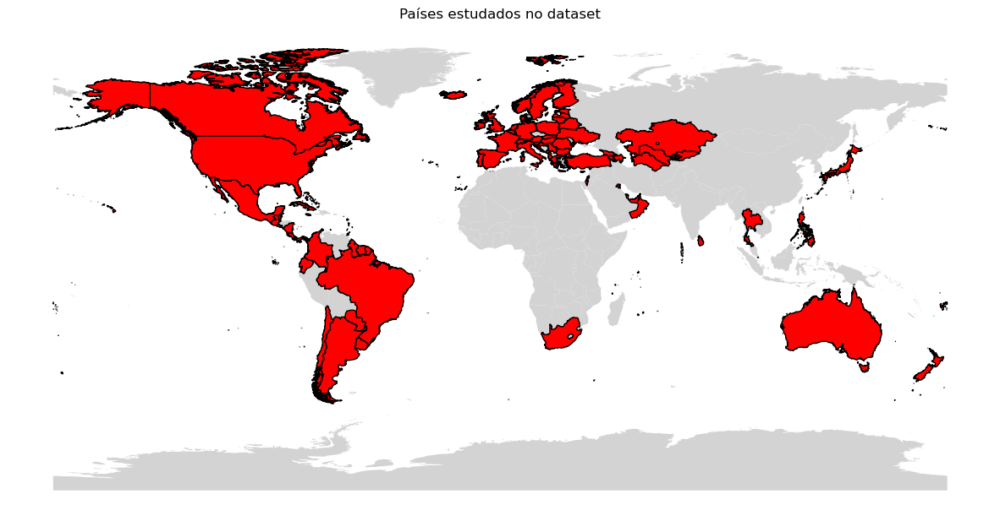

In [29]:
# Ler o ficheiro shapefile das fronteiras dos países 'ne_10m_admin_0_countries.shp' através do GeoPandas
world = gpd.read_file('ne_10m_admin_0_countries.shp')

# Selecionar os países a destacar com base na coluna 'country' do DataFrame 'df1'
countries_to_highlight = df1['country']

# Filtrar o DataFrame da GeoPandas para incluir apenas os países a destacar
world_filtered = world[world['NAME'].isin(countries_to_highlight)]

# Plotar o mapa
world.plot(figsize=(15, 10), color='lightgray')
world_filtered.plot(ax=plt.gca(), color='red', edgecolor='k')
plt.title('Países estudados no dataset')
plt.axis('off')
plt.show()

In [30]:
print("Países estudados no dataset")
# Ler o ficheiro shapefile das fronteiras dos países 'ne_10m_admin_0_countries.shp' através do GeoPandas
world = gpd.read_file('ne_10m_admin_0_countries.shp')

# Selecionar os países a destacar com base na coluna 'country' do DataFrame 'df1'
countries_to_highlight = df1['country']

# Filtrar o DataFrame da GeoPandas para incluir apenas os países a destacar
world_filtered = world[world['NAME'].isin(countries_to_highlight)]

# Create a folium map centered on a specific location (for example, center of the filtered data)
center = [world_filtered.geometry.centroid.y.mean(), world_filtered.geometry.centroid.x.mean()]
m = folium.Map(location=center, zoom_start=2)

# Add GeoPandas data to the folium map as GeoJSON
folium.GeoJson(world_filtered).add_to(m)

# Display the map
m

Países estudados no dataset


#### 4.1 - Análise por tabelas de valores

In [31]:
# Número de suicídios por país
pd.DataFrame(df1.groupby('country')['suicides_no'].sum())

,suicides_no
country,
Albania,1970
Antigua and Barbuda,11
Argentina,82219
Armenia,1838
Australia,70111
...,...
United Arab Emirates,622
United Kingdom,136805
United States of America,1034013


In [32]:
# Número de suicídios por género
pd.DataFrame(df1.groupby('sex')['suicides_no'].sum())

,suicides_no
sex,
female,1257963
male,3994112


O sexo com mais casos de suicídio, dentro do período analisado, é o masculino. Os casos no sexo masculino representam 3.33 vezes mais do que no sexo feminino.

In [33]:
# Grouping by year and summing 'suicides/100k pop'
suicides_by_year = pd.DataFrame(df1.groupby('year')['suicides_no'].sum())

# Sorting the DataFrame by 'suicides/100k pop' in ascending order
suicides_by_year_sorted = suicides_by_year.sort_values(by='suicides_no', ascending=True)

# Apply a background gradient to highlight values in the DataFrame
styled_table = suicides_by_year_sorted.style.background_gradient(cmap='Greys', subset=['suicides_no'])

# Display the styled table
styled_table

,suicides_no
year,
1985,112105
1986,116902
1988,117763
1989,118973
1987,123269
1990,150803
1991,155305
1993,161238
1992,161699


A mudança de milénio foi, claramente, a época com maior gravidade, sendo 2003 o ano com maior número de suicídios, dentro do período analisado.

In [34]:
# Grouping by generation and summing 'suicides_no'
suicides_by_generation = pd.DataFrame(df1.groupby('generation')['suicides_no'].sum())

# Sorting the DataFrame by 'suicides_no' in ascending order
suicides_by_generation_sorted = suicides_by_generation.sort_values(by='suicides_no', ascending=True)

# Apply a background gradient to highlight values in the DataFrame
styled_table_generation = suicides_by_generation_sorted.style.background_gradient(cmap='Greys', subset=['suicides_no'], vmin=suicides_by_generation_sorted['suicides_no'].min(), vmax=suicides_by_generation_sorted['suicides_no'].max() * 0.8)

# Display the styled table for suicides by generation
styled_table_generation


,suicides_no
generation,
Generation Z,13719
G.I. Generation,450841
Millenials,478165
Generation X,1178667
Silent,1411741
Boomers,1718942




- G.I Generation(Greatest Generation):1901-1927
- Silient:1928-1945
- Boomers:1946-1964
- Generation X:1965-1980
- Millenials(Generation Y):1981-1996
- Generation Z:1997-?



Analisando o número de suicídios por geração, é possível identificar os "Boomers" como a geração com maior número de suicídios. O período pós guerra ficou marcado pela sua prosperidade, mas também pela reconfiguração do conceito de família e oportunidades profissionais. O aumento do número de divórcios, bem como a pressão social proveniente das novas carreiras profissionais estarão certamente entre as maiores causas de problemas ao nível da saúde mental.

In [35]:
# Grouping by age and summing 'suicides_no'
suicides_by_age = pd.DataFrame(df1.groupby('age')['suicides_no'].sum())

# Sorting the DataFrame by 'suicides_no' in ascending order
suicides_by_age_sorted = suicides_by_age.sort_values(by='suicides_no', ascending=True)

# Apply a background gradient to highlight values in the DataFrame
styled_table_age = suicides_by_age_sorted.style.background_gradient(cmap='Greys', subset=['suicides_no'], vmin=suicides_by_age_sorted['suicides_no'].min(), vmax=suicides_by_age_sorted['suicides_no'].max() * 0.8)

# Display the styled table for suicides by age
styled_table_age


,suicides_no
age,
5-14 years,41934
75+ years,548180
15-24 years,633484
25-34 years,845842
55-74 years,1315191
35-54 years,1867444


#### 4.1 - Análise por gráficos

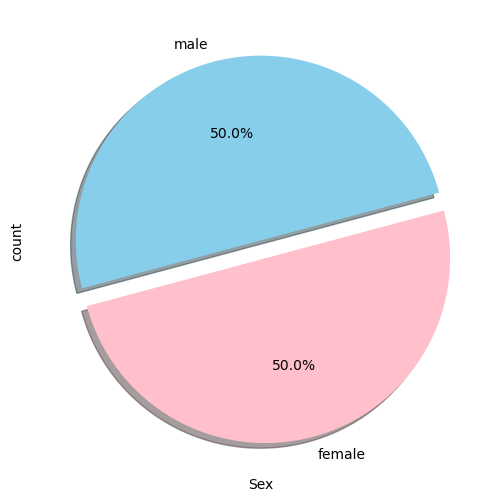

In [36]:
plt.figure(figsize=(6,6))
df1['sex'].value_counts().plot.pie(explode=[0,0.1],autopct='%1.1f%%',shadow=True,startangle=15, colors=['skyblue', 'pink'])
plt.xlabel("Sex")
plt.show()

De modo a garantir a credibilidade da amostragem no que toca a análise por sexo, podemos concluir que a amostra conta com, exatamente, 50% indivíduos do sexo masculino e 50% do sexo feminino.

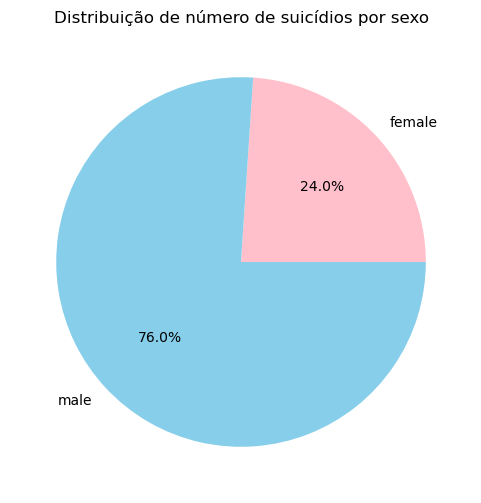

In [37]:
# Calcular a soma das taxas de suicídio por 100k habitantes por sexo
sex_suicide_sum = df1.groupby('sex')['suicides_no'].sum()

# Criar um gráfico de pizza
plt.figure(figsize=(6, 6))
plt.pie(sex_suicide_sum, labels=sex_suicide_sum.index, autopct='%1.1f%%', colors=['pink', 'skyblue'])
plt.title('Distribuição de número de suicídios por sexo')
plt.show()

Podemos concluir que 76% do total de suicídios foram cometidos por indivíduos do sexo masculino. A utilização de métodos de conclusão mais eficaz, a falta de encorajamento para procurar ajuda psicológica e a exposição a um corrente contexto social onde a sua vulnerabilidade é vista como uma fraqueza, serão certamente uns dos motivos para a disparidade entre o número de suicídios entre os homens e as mulheres.

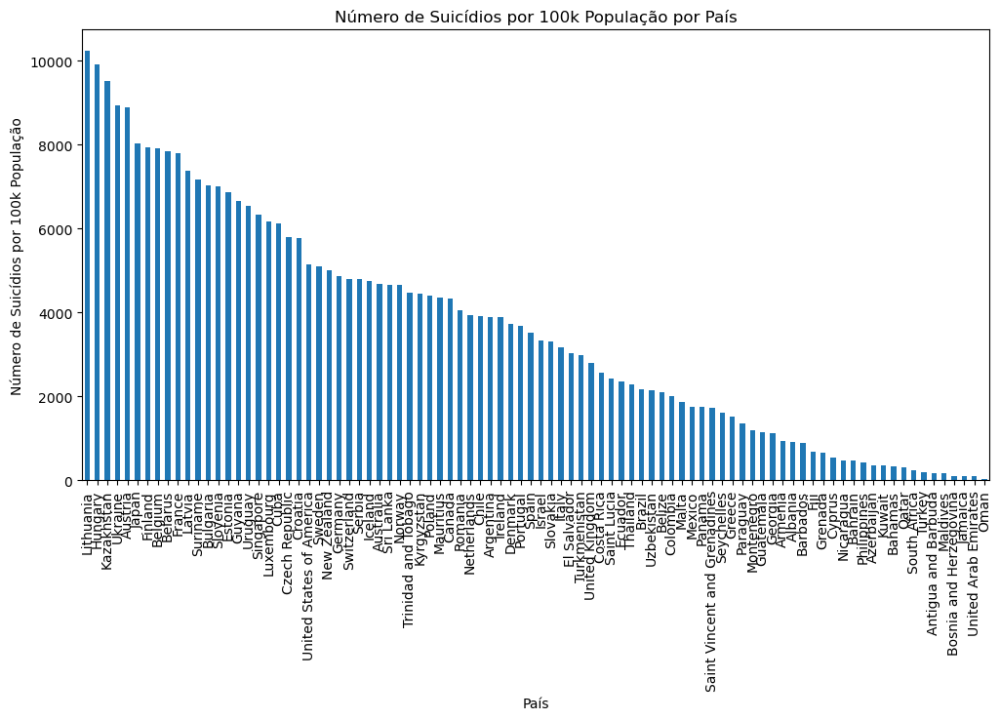

In [38]:
# Agrupe os dados por país e calcule a média de 'suicides/100k pop' para cada país
grouped = df1.groupby('country')
mean_suicides_per_100k = grouped['suicides/100k pop'].sum()

# Classifique os valores médios em ordem decrescente
mean_suicides_per_100k = mean_suicides_per_100k.sort_values(ascending=False)

# Crie um gráfico de barras
mean_suicides_per_100k.plot(kind='bar', figsize=(12, 6))

# Defina rótulos para o gráfico
plt.title('Número de Suicídios por 100k População por País')
plt.xlabel('País')
plt.ylabel('Número de Suicídios por 100k População')

# Exiba o gráfico
plt.show()

Diversos estudos, incluindo a pesquisa de Zemaitiene e Zaborskis (2005) publicada na revista científica "Medicina," destacam algumas das possíveis razões para a Lituânia ter um problema tão grave ao nível de casos de suicídio. Fatores como altas taxas de desemprego, instabilidade econômica, o impacto histórico do comunismo e transição para uma economia de mercado, bem como o consumo significativo de álcool, têm sido associados a uma maior vulnerabilidade à depressão e ao suicídio na população lituana. Além disso, a estigmatização em torno de questões de saúde mental e a falta de recursos adequados para prevenção e tratamento podem contribuir para a persistência desse desafio.

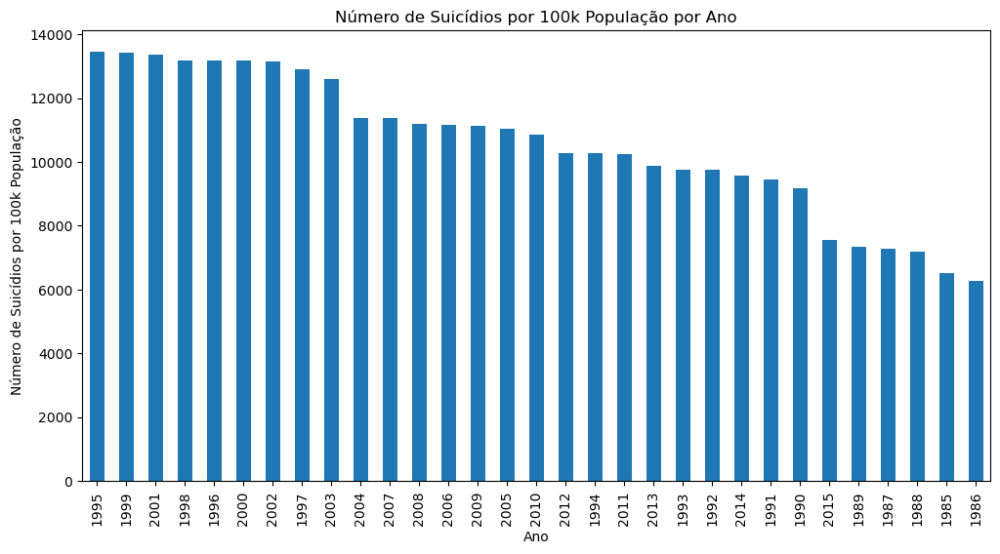

In [39]:
# Agrupe os dados por país e calcule a média de 'suicides/100k pop' para cada país
grouped = df1.groupby('year')
mean_suicides_per_100k = grouped['suicides/100k pop'].sum()

# Classifique os valores médios em ordem decrescente
mean_suicides_per_100k = mean_suicides_per_100k.sort_values(ascending=False)

# Crie um gráfico de barras
mean_suicides_per_100k.plot(kind='bar', figsize=(12, 6))

# Defina rótulos para o gráfico
plt.title('Número de Suicídios por 100k População por Ano')
plt.xlabel('Ano')
plt.ylabel('Número de Suicídios por 100k População')

# Exiba o gráfico
plt.show()

É notória a relação entre o final do milénio e o aumento da taxa de suicídio. Estudos, como o trabalho de Stack (2000) publicado na revista "Social Forces," sugerem que mudanças socioeconómicas, instabilidade no mercado de trabalho e transformações culturais podem ter contribuído para esse aumento. O final do milénio testemunhou mudanças rápidas na tecnologia, globalização e nas estruturas sociais, gerando incertezas e pressões adicionais sobre a população. 

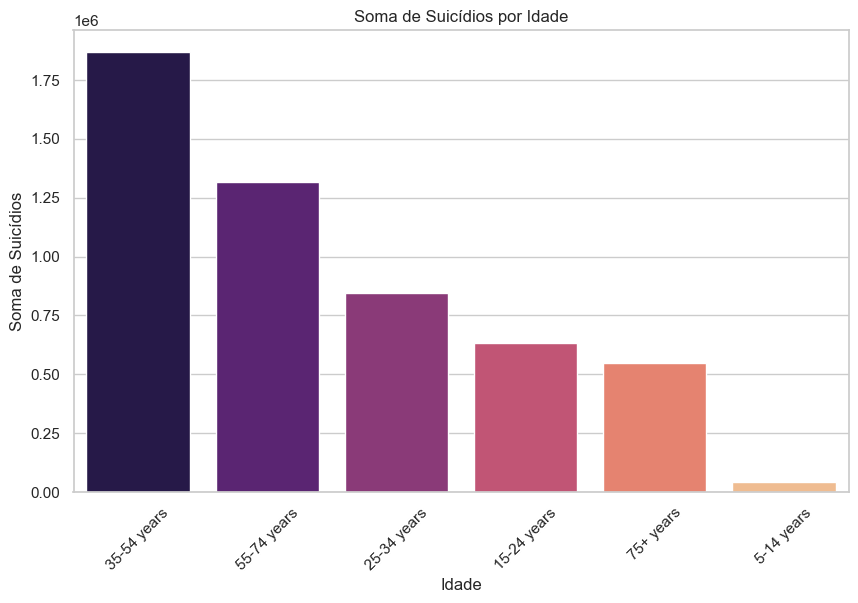

In [40]:
# Calcular a soma das taxas de suicídio por geração
generation_sum = df1.groupby('age')['suicides_no'].sum().reset_index()

# Ordenar o DataFrame em ordem decrescente
generation_sum = generation_sum.sort_values(by='suicides_no', ascending=False)

# Criar um gráfico de barras ordenado
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.barplot(x="age", y="suicides_no", data=generation_sum, palette="magma")
plt.xlabel('Idade')
plt.ylabel('Soma de Suicídios')
plt.title('Soma de Suicídios por Idade')
plt.xticks(rotation=45)
plt.show()

Podemos concluir que a maioria dos casos de suicídio acontecem em idades onde os indivíduos serão profissionalmente ativos. A relação entre trabalho e saúde mental tem vindo a ganhar cada vez mais notoriedade devido a cosnciencialização de que a esfera profissional, devido à situação financeira, competetividade e *overworking* é um dos principais fatores para o degradamento psicológico das pessoas.

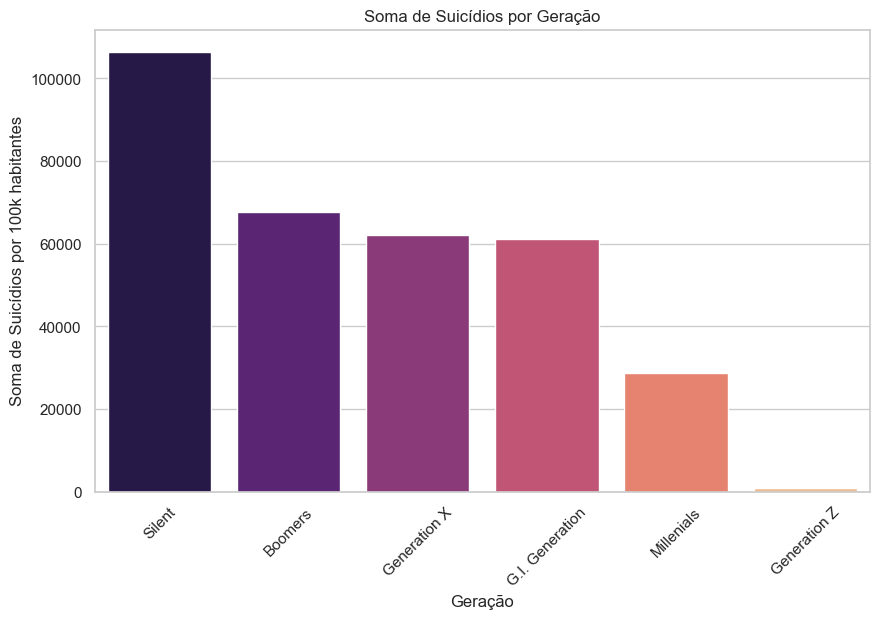

In [41]:
# Calcular a soma das taxas de suicídio por geração
generation_sum = df1.groupby('generation')['suicides/100k pop'].sum().reset_index()

# Ordenar o DataFrame em ordem decrescente
generation_sum = generation_sum.sort_values(by='suicides/100k pop', ascending=False)

# Criar um gráfico de barras ordenado
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")
sns.barplot(x="generation", y="suicides/100k pop", data=generation_sum, palette="magma")
plt.xlabel('Geração')
plt.ylabel('Soma de Suicídios por 100k habitantes')
plt.title('Soma de Suicídios por Geração')
plt.xticks(rotation=45)
plt.show()

A geração *Silent* é claramente distinta por estar inserida entre a 1ª e 2ª Guerra Mundial. Não só o período de instabilidade económica que se viveu, como também as mazelas psicológicas que a guerra causou, maioritariamente ao nível de casos de stress pós-traumático, resultaram nos principais fatores para a taxa de sucídio ser evidentemente maior nesta geração.

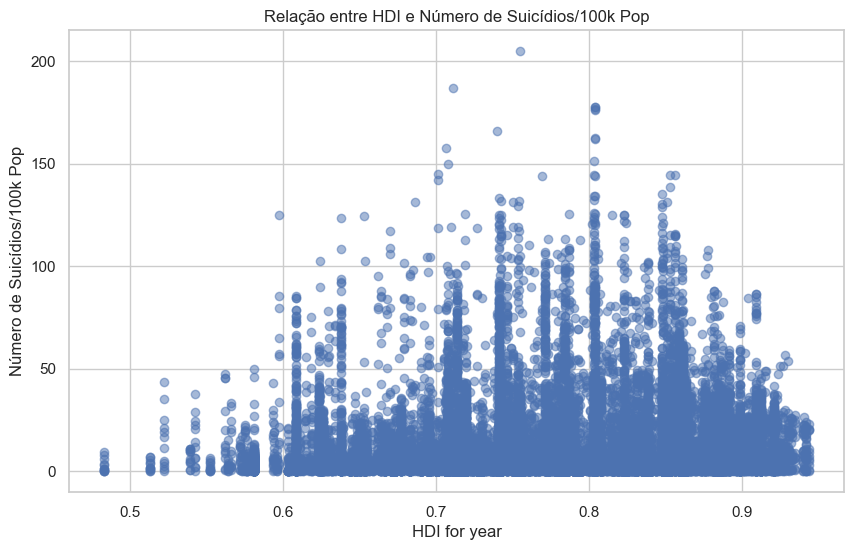

In [42]:
# Filtrar o DataFrame para remover linhas com valores nulos em 'HDI for year' e 'suicides_no'
df_filtered = df1.dropna(subset=['HDI for year', 'suicides/100k pop'])

# Criar um gráfico de dispersão
plt.figure(figsize=(10, 6))
plt.scatter(df_filtered['HDI for year'], df_filtered['suicides/100k pop'], alpha=0.5)
plt.xlabel('HDI for year')
plt.ylabel('Número de Suicídios/100k Pop')
plt.title('Relação entre HDI e Número de Suicídios/100k Pop')
plt.grid(True)
plt.show()

Com este gráfico, relacionando a taxa de suicídio com o índice de Desenvolvimento Humano, podemos observar que existe uma clara concentração de casos com taxa de suicídio alta quando o HDI é maior.

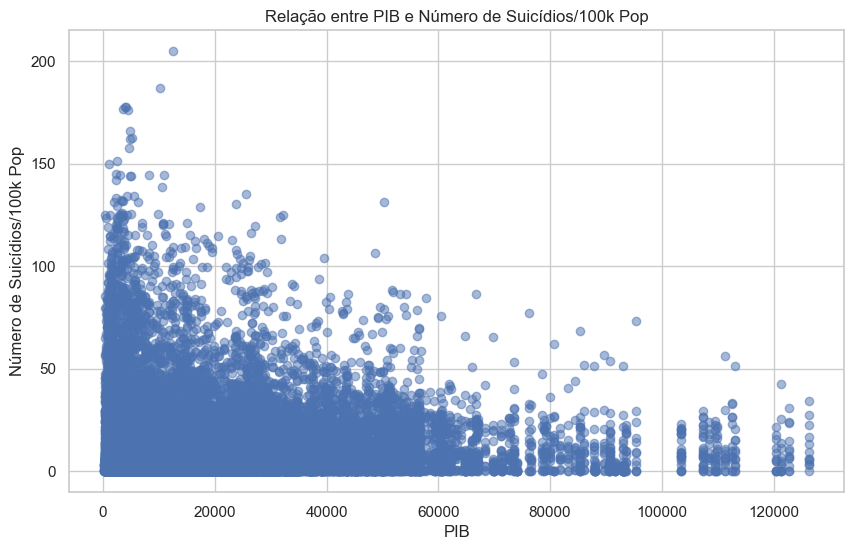

In [43]:
# Filtrar o DataFrame para remover linhas com valores nulos em 'HDI for year' e 'suicides_no'
df_filtered = df1.dropna(subset=['gdp_per_capita', 'suicides/100k pop'])

# Criar um gráfico de dispersão
plt.figure(figsize=(10, 6))
plt.scatter(df_filtered['gdp_per_capita'], df_filtered['suicides/100k pop'], alpha=0.5)
plt.xlabel('PIB')
plt.ylabel('Número de Suicídios/100k Pop')
plt.title('Relação entre PIB e Número de Suicídios/100k Pop')
plt.grid(True)
plt.show()

O contexto económico e financeiro representa um dos principais fatores que influenciam os casos de suicídio. Com esta representação gráfica conseguimos concluir que a taxa de sucídio apresenta um maior nível em países onde o PIB é menor.

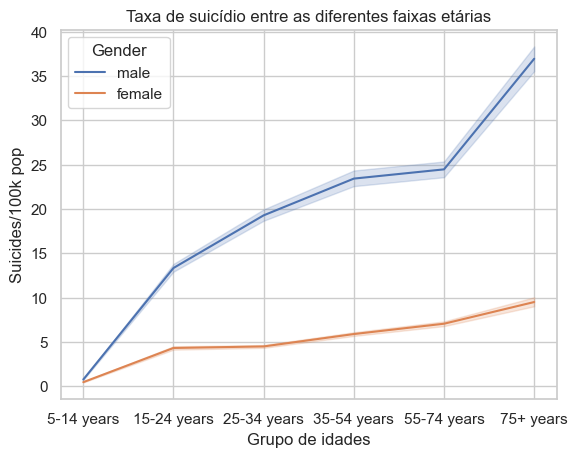

In [44]:
# Define the age groups with a specific order
age_order = ['5-14 years', '15-24 years', '25-34 years', '35-54 years', '55-74 years', '75+ years']

# Convert 'age' column to categorical with the defined order
df1['age'] = pd.Categorical(df1['age'], categories=age_order, ordered=True)

# Plot with the reordered age groups
sns.lineplot(x='age', y='suicides/100k pop', hue='sex', data=df1)
plt.xlabel('Grupo de idades')
plt.ylabel('Suicides/100k pop')
plt.title('Taxa de suicídio entre as diferentes faixas etárias')
plt.legend(title='Gender')
plt.show()

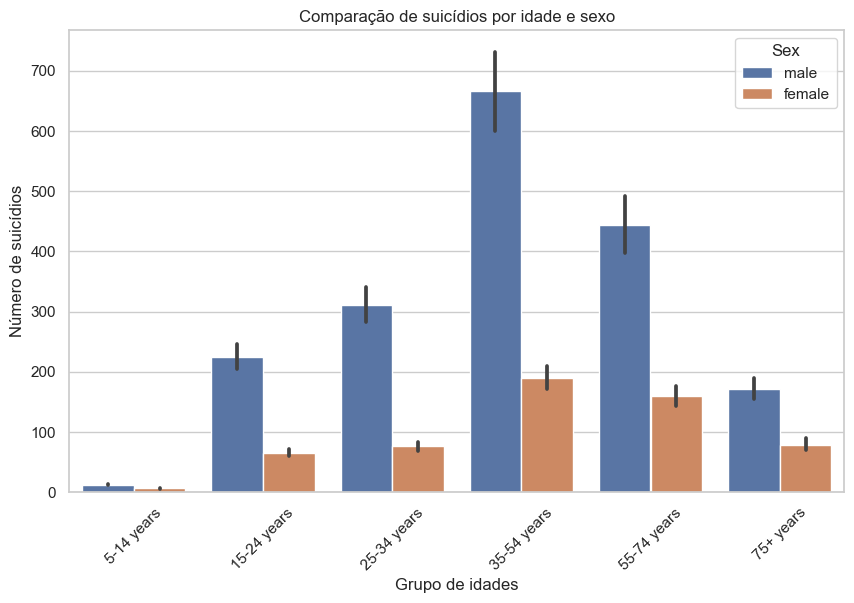

In [45]:
# Define the age groups with a specific order
age_order = ['5-14 years', '15-24 years', '25-34 years', '35-54 years', '55-74 years', '75+ years']

# Convert 'age' column to categorical with the defined order
df1['age'] = pd.Categorical(df1['age'], categories=age_order, ordered=True)

# Plotting the comparison of suicides_no between sex and age groups
plt.figure(figsize=(10, 6))
sns.barplot(x='age', y='suicides_no', hue='sex', data=df1)
plt.xlabel('Grupo de idades')
plt.ylabel('Número de suicídios')
plt.title('Comparação de suicídios por idade e sexo')
plt.legend(title='Sex')
plt.xticks(rotation=45)
plt.show()

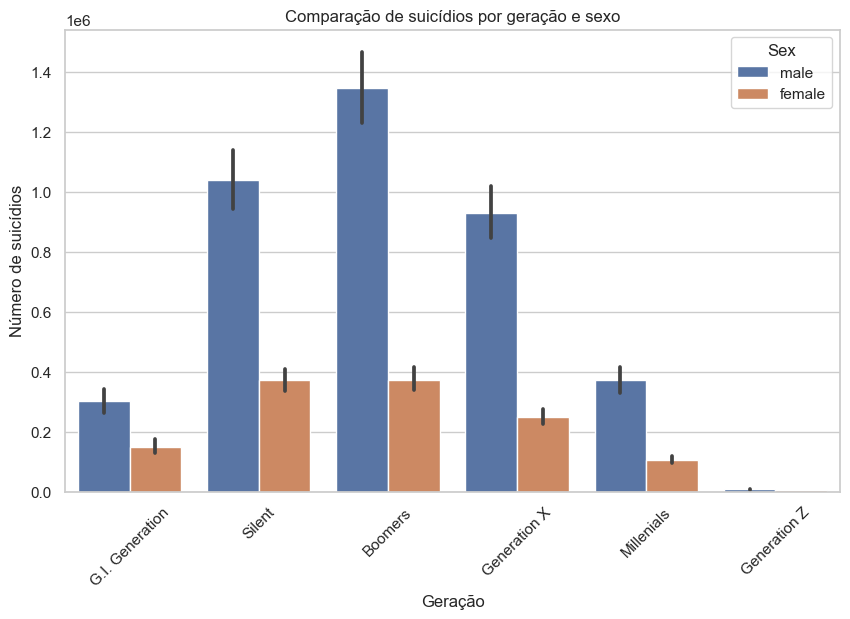

In [46]:
# Define the custom order for generations
generation_order = ['G.I. Generation', 'Silent', 'Boomers', 'Generation X', 'Millenials', 'Generation Z']

# Convert 'generation' column to categorical with the defined order
df1['generation'] = pd.Categorical(df1['generation'], categories=generation_order, ordered=True)

# Create a bar plot to compare suicides_no between generation and sex
plt.figure(figsize=(10, 6))
sns.barplot(x='generation', y='suicides_no', hue='sex', data=df1, estimator=sum)
plt.xlabel('Geração')
plt.ylabel('Número de suicídios')
plt.title('Comparação de suicídios por geração e sexo')
plt.legend(title='Sex')
plt.xticks(rotation=45)
plt.show()

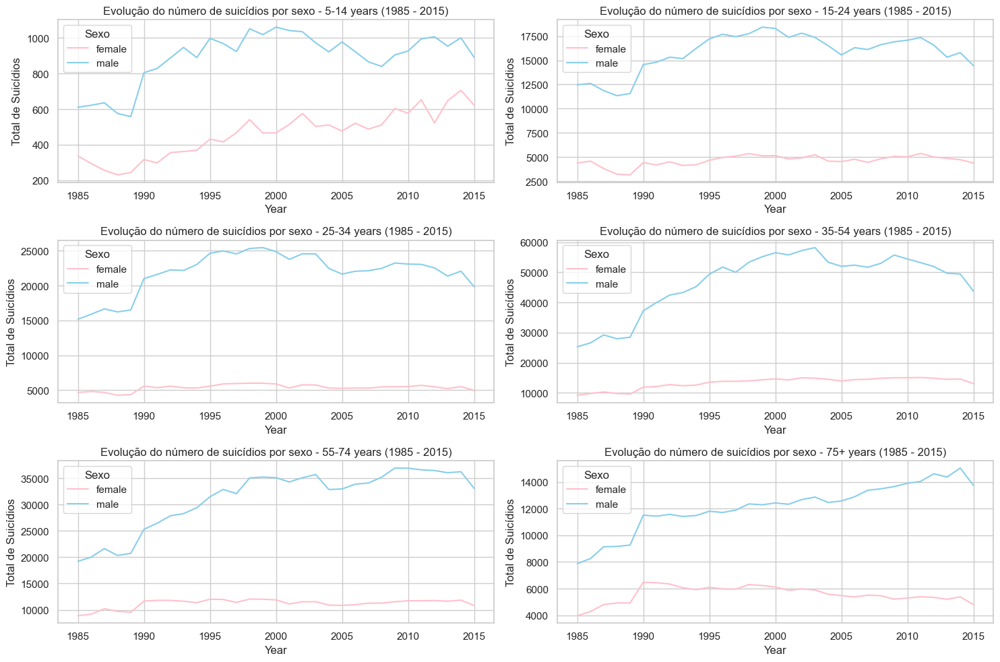

In [47]:
# Group data by year, sex, and age, then calculate the total number of suicides
grouped_data = df1.groupby(['year', 'sex', 'age'])['suicides_no'].sum().reset_index()

# Get unique age categories
age_categories = grouped_data['age'].unique()

# Calculate number of plots needed for the grid layout (2x2)
num_plots = len(age_categories)
num_cols = 2
num_rows = 3

# Create a grid layout of plots (2x2)
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Flatten the axis array to simplify iteration
axs = axs.flatten()

for i, age_category in enumerate(age_categories[:num_cols*num_rows]):
    # Subset data for the current age category
    age_data = grouped_data[grouped_data['age'] == age_category]
    
    # Calculate subplot position in the 2x2 grid
    row = i // num_cols
    col = i % num_cols
    
    # Plotting each age category
    for sex in age_data['sex'].unique():
        sex_data = age_data[age_data['sex'] == sex]
        
        # Update the lineplot to specify colors for each sex
        if sex == 'male':
            sns.lineplot(x='year', y='suicides_no', data=sex_data, label=sex, ax=axs[i], color='skyblue')
        else:
            sns.lineplot(x='year', y='suicides_no', data=sex_data, label=sex, ax=axs[i], color='pink')
        
    axs[i].set_title(f'Evolução do número de suicídios por sexo - {age_category} (1985 - 2015)')
    axs[i].set_xlabel('Year')
    axs[i].set_ylabel('Total de Suicídios')
    axs[i].legend(title='Sexo')
    axs[i].grid(True)

# Hide empty subplots if needed
for j in range(num_plots, num_cols * num_rows):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


Como já antes referido, é evidente a disparidade no número de suicídios entre homens e mulheres. Verifica-se também que, desde 1985 até 2015, o número de suicídios por ano tem vindo a aumentar, principalmente nos homens.

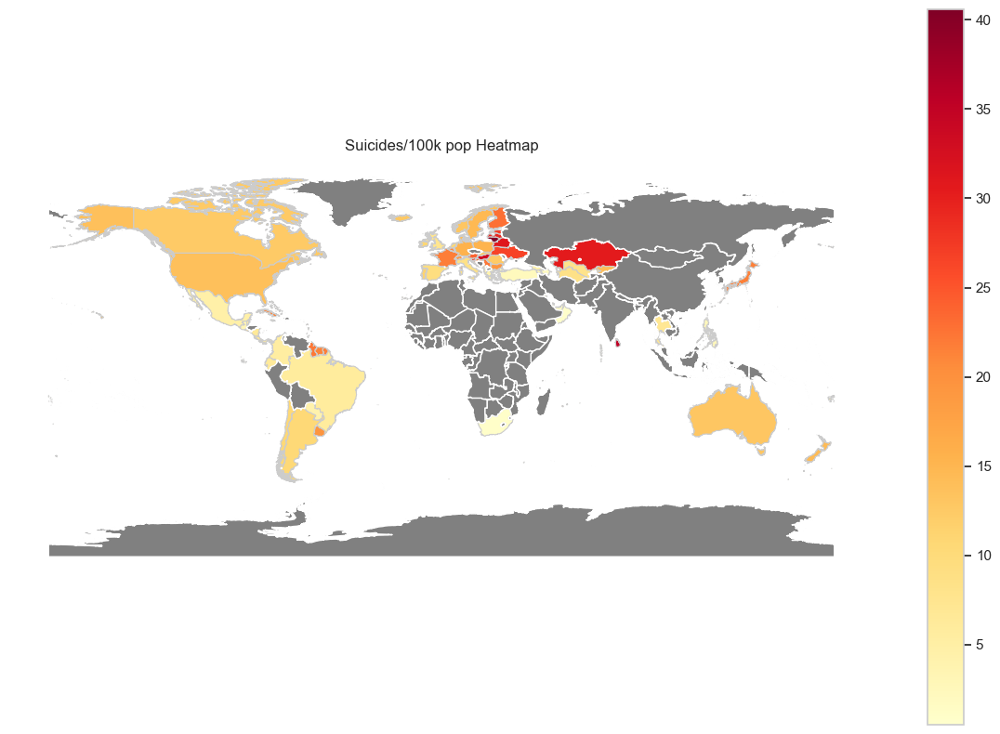

In [48]:
# Calculate mean suicides/100k pop for each country in your DataFrame 'df1'
mean_suicides = df1.groupby('country')['suicides/100k pop'].mean().reset_index()

# Merge mean suicide rates with the filtered world data
world_merged = world_filtered.merge(mean_suicides, how='left', left_on='NAME', right_on='country')

# Plot the world map with the heatmap for countries in the DataFrame
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world_merged.plot(column='suicides/100k pop', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Get the list of countries in the DataFrame 'df1'
countries_in_df = world_merged['NAME'].tolist()

# Create a GeoDataFrame for countries not in the DataFrame 'df1'
world_not_in_df = world[~world['NAME'].isin(countries_in_df)]

# Plot countries not in the DataFrame 'df1' in black
world_not_in_df.plot(ax=ax, color='grey')

plt.title('Suicides/100k pop Heatmap')
plt.axis('off')
plt.show()

Com este *heatmap* verifica-se claramente um desnível entre a taxa de suicídio de países leste da europa, com os restantes países estudados.

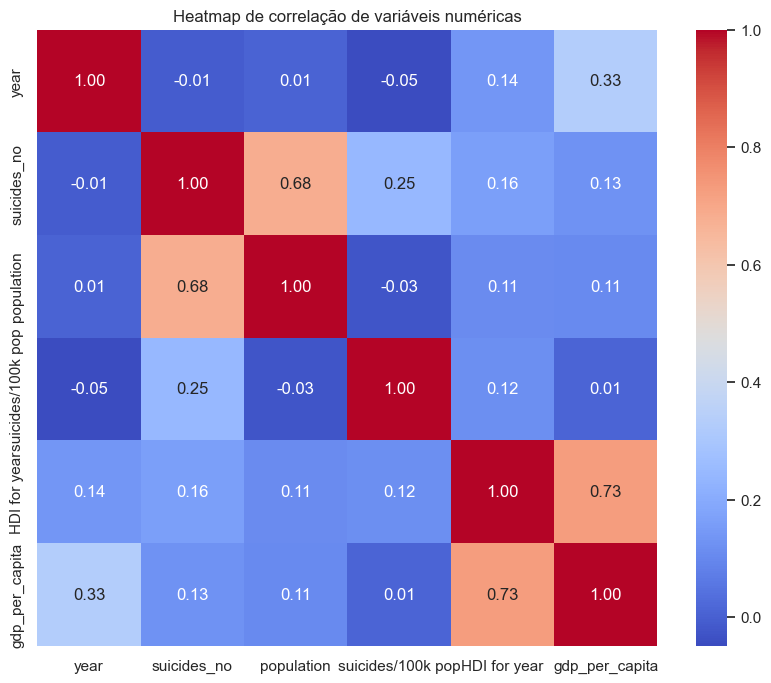

In [49]:
# Selecting only numeric columns
numeric_columns = df1.select_dtypes(include=['int64', 'float64'])

# Compute the correlation matrix
correlation_matrix = numeric_columns.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap of the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Heatmap de correlação de variáveis numéricas')
plt.show()

Analisando este mapa, podemos observar que as variáveis de número de suicídios e contagem da população são as únicas com uma correlação significativa.

# PORTUGAL

Pretendemos, não só fazer uma análise à escala global, como também a uma escala nacional, analisando os dados presentes no mesmo dataset respetivos a Portugal.

In [50]:
portugal_data = df1[df1['country'] == 'Portugal']
print(portugal_data.info())

<class 'pandas.core.frame.DataFrame'>
Index: 324 entries, 19356 to 19679
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   country            324 non-null    object  
 1   year               324 non-null    int64   
 2   sex                324 non-null    object  
 3   age                324 non-null    category
 4   suicides_no        324 non-null    int64   
 5   population         324 non-null    int64   
 6   suicides/100k pop  324 non-null    float64 
 7   HDI for year       324 non-null    float64 
 8   gdp_for_year       324 non-null    object  
 9   gdp_per_capita     324 non-null    int64   
 10  generation         324 non-null    category
dtypes: category(2), float64(2), int64(4), object(3)
memory usage: 26.4+ KB
None


In [51]:
print(portugal_data.describe())

              year  suicides_no    population  suicides/100k pop  \
count   324.000000   324.000000  3.240000e+02         324.000000   
mean   1998.888889    74.262346  8.063544e+05          11.337531   
std       8.926254    76.118831  3.402307e+05          15.254230   
min    1985.000000     0.000000  1.605540e+05           0.000000   
25%    1991.000000    15.750000  5.763775e+05           2.060000   
50%    1998.000000    53.500000  7.604535e+05           6.025000   
75%    2008.000000    99.500000  1.044950e+06          12.375000   
max    2014.000000   305.000000  1.615851e+06          71.420000   

       HDI for year  gdp_per_capita  
count    324.000000      324.000000  
mean       0.784000    14176.296296  
std        0.031422     6933.413815  
min        0.676000     2912.000000  
25%        0.784000     9483.000000  
50%        0.784000    12469.000000  
75%        0.784000    22641.000000  
max        0.830000    26121.000000  


In [52]:
# Obter os anos únicos presentes nos dados de Portugal
anos_portugal = portugal_data['year'].unique()
print(anos_portugal)


[1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998
 1999 2000 2001 2002 2003 2007 2008 2009 2010 2011 2012 2013 2014]


Depois de explorar um pouco do que são os dados referentes a Portugal, identificamos a falta de dados em 5 anos, 2004, 2005, 2006, 2015, e 2016.

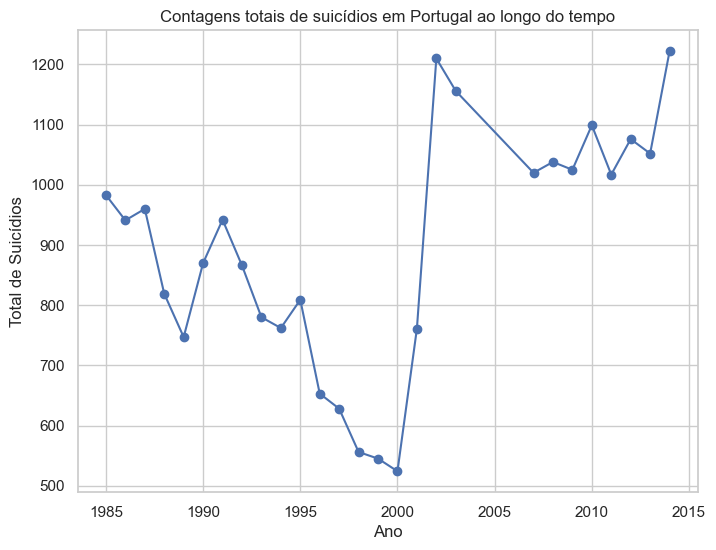

In [53]:
# Filter data for Portugal
portugal_data = df1[df1['country'] == 'Portugal']

# Calculate total suicides (suicides_no) for each year
suicides_count_yearly = portugal_data.groupby('year')['suicides_no'].sum()

plt.figure(figsize=(8, 6))
plt.plot(suicides_count_yearly.index, suicides_count_yearly.values, marker='o', linestyle='-', color='b')
plt.title('Contagens totais de suicídios em Portugal ao longo do tempo')
plt.xlabel('Ano')
plt.ylabel('Total de Suicídios')
plt.grid(True)
plt.show()

Na transição para o novo milénio, á semelhança do que foi verificado a nível global, o total de casos de suicídios aumentou consideravelmente.

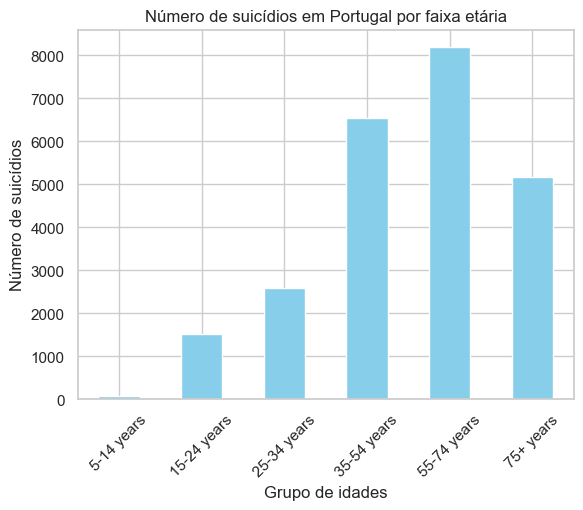

In [54]:
# Grouping by 'age' and calculating mean 'suicides/100k pop'
age_suicide_stats = portugal_data.groupby('age')['suicides_no'].sum()
# Visualizing age-wise suicide rates (Bar plot)
age_suicide_stats.plot(kind='bar', color='skyblue')
plt.title('Número de suicídios em Portugal por faixa etária')
plt.xlabel('Grupo de idades')
plt.ylabel('Número de suicídios')
plt.xticks(rotation=45)
plt.show()

Verificam-se, à semelhança do que foi verificado à escala global, maiores níveis de suicídio em faixas etárias onde a população é profissionalmente ativa, dos 35-54 anos e 55-74 anos.

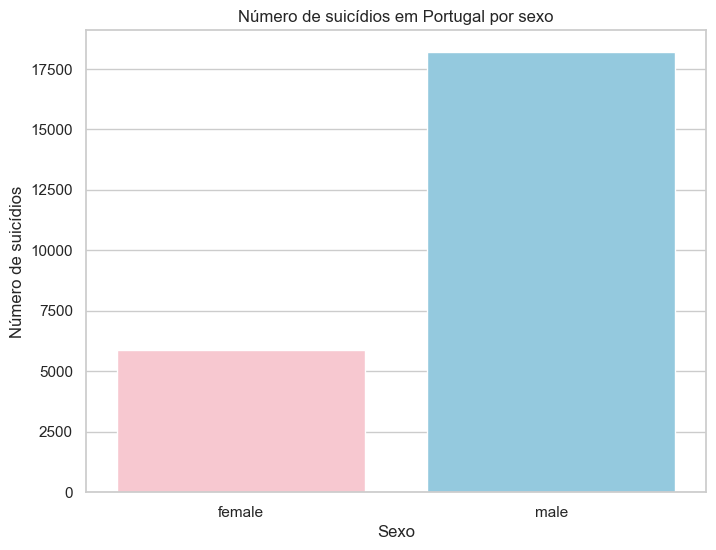

In [55]:
# Group data by sex and calculate total suicides for each sex
suicides_by_sex = portugal_data.groupby('sex')['suicides_no'].sum().reset_index()

# Create a bar plot to compare suicides by sex with custom colors
plt.figure(figsize=(8, 6))
sns.barplot(x='sex', y='suicides_no', data=suicides_by_sex, palette=['pink', 'skyblue'])
plt.title('Número de suicídios em Portugal por sexo')
plt.xlabel('Sexo')
plt.ylabel('Número de suicídios')
plt.show()

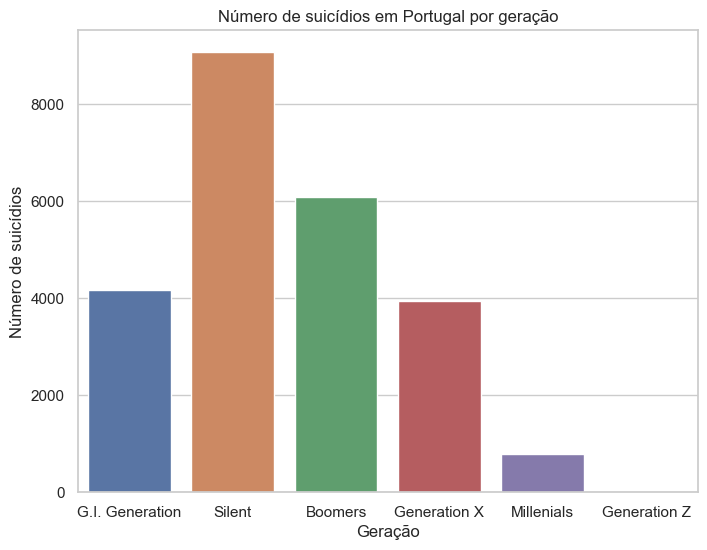

In [56]:
# Group data by sex and calculate total suicides for each sex
suicides_by_sex = portugal_data.groupby('generation')['suicides_no'].sum().reset_index()

# Create a bar plot to compare suicides by sex with custom colors
plt.figure(figsize=(8, 6))
sns.barplot(x='generation', y='suicides_no', data=suicides_by_sex)
plt.title('Número de suicídios em Portugal por geração')
plt.xlabel('Geração')
plt.ylabel('Número de suicídios')
plt.show()

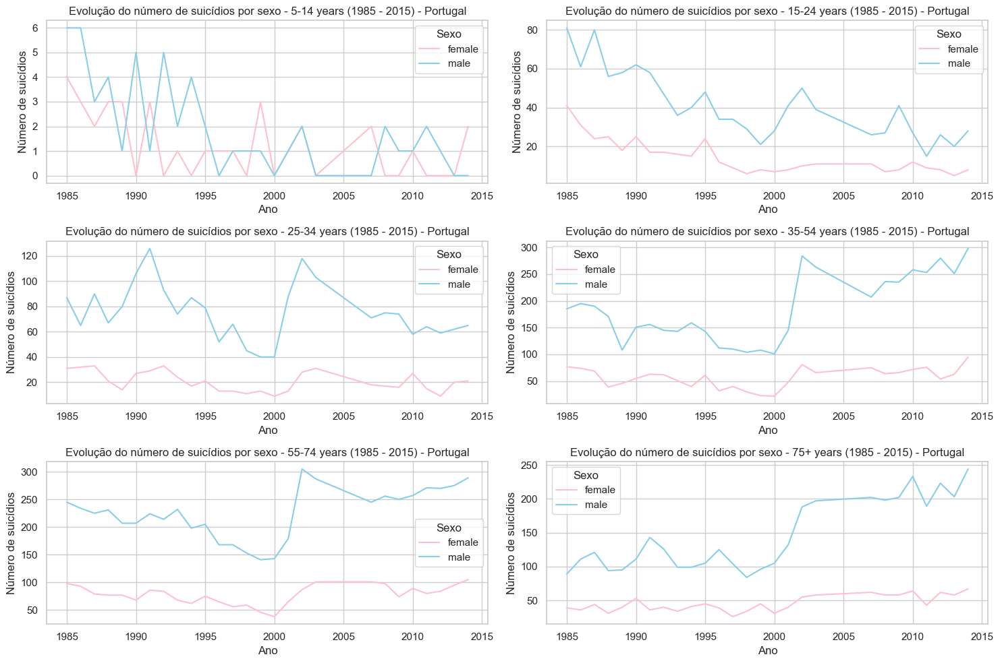

In [57]:
# Group data by year, sex, and age for Portugal, then calculate the total number of suicides
grouped_data_portugal = portugal_data.groupby(['year', 'sex', 'age'])['suicides_no'].sum().reset_index()

# Get unique age categories for Portugal
age_categories_portugal = grouped_data_portugal['age'].unique()

# Calculate number of plots needed for the grid layout (2x2)
num_plots_portugal = len(age_categories_portugal)
num_cols = 2
num_rows_portugal = 3

# Create a grid layout of plots (2x2)
fig, axs = plt.subplots(num_rows_portugal, num_cols, figsize=(15, 10))

# Flatten the axis array to simplify iteration
axs = axs.flatten()

for i, age_category in enumerate(age_categories_portugal[:num_cols*num_rows_portugal]):
    # Subset data for the current age category
    age_data_portugal = grouped_data_portugal[grouped_data_portugal['age'] == age_category]
    
    # Calculate subplot position in the 2x2 grid
    row = i // num_cols
    col = i % num_cols
    
    # Plotting each age category for Portugal
    for sex in age_data_portugal['sex'].unique():
        sex_data_portugal = age_data_portugal[age_data_portugal['sex'] == sex]
        
        # Update the lineplot to specify colors for each sex
        if sex == 'male':
            sns.lineplot(x='year', y='suicides_no', data=sex_data_portugal, label=sex, ax=axs[i], color='skyblue')
        else:
            sns.lineplot(x='year', y='suicides_no', data=sex_data_portugal, label=sex, ax=axs[i], color='pink')
        
    axs[i].set_title(f'Evolução do número de suicídios por sexo - {age_category} (1985 - 2015) - Portugal')
    axs[i].set_xlabel('Ano')
    axs[i].set_ylabel('Número de suicídios')
    axs[i].legend(title='Sexo')
    axs[i].grid(True)

# Hide empty subplots if needed
for j in range(num_plots_portugal, num_cols * num_rows_portugal):
    axs[j].axis('off')

plt.tight_layout()
plt.show()


Concluímos que Portugal não foge ao que é a realidade global do que foi analisado ao nível das descrepãncias nos casos de suicídio entre homens e mulheres (com os homens a representarem a maioria dos casos) e a geração com mais casos ter sido a *Silent*, compreendida entre a 1ª e 2ª Guerra Mundial. É ainda notório o aumento dos casos por ano, dando especial ênfase ao ano 2000, onde se começa a verificar uma subida significativa.

# Machine Learning

In [58]:
dfml = df1.copy()

In [59]:
dfml.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26184 entries, 0 to 27819
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   country            26184 non-null  object  
 1   year               26184 non-null  int64   
 2   sex                26184 non-null  object  
 3   age                26184 non-null  category
 4   suicides_no        26184 non-null  int64   
 5   population         26184 non-null  int64   
 6   suicides/100k pop  26184 non-null  float64 
 7   HDI for year       26184 non-null  float64 
 8   gdp_for_year       26184 non-null  object  
 9   gdp_per_capita     26184 non-null  int64   
 10  generation         26184 non-null  category
dtypes: category(2), float64(2), int64(4), object(3)
memory usage: 2.0+ MB


In [60]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [61]:
categorical = ['country', 'sex', 'age', 'generation']
le = LabelEncoder()

for column in categorical:
    dfml[column] = le.fit_transform(dfml[column])

In [62]:
from sklearn.preprocessing import RobustScaler

dfml['gdp_for_year'] = dfml['gdp_for_year'].astype(str).str.replace(',', '').astype(float)

numerical = ['year', 'suicides_no', 'population', 'gdp_for_year', 'gdp_per_capita']

rc = RobustScaler()
dfml[numerical] = rc.fit_transform(dfml[numerical])


In [63]:
dfml

,country,year,sex,age,suicides_no,population,suicides/100k pop,HDI for year,gdp_for_year,gdp_per_capita,generation
0,0,-1.153846,1,0,-0.024793,-0.090655,6.71,0.673,-0.183030,-0.379931,2
1,0,-1.153846,1,2,-0.066116,-0.094366,5.19,0.673,-0.183030,-0.379931,5
2,0,-1.153846,0,0,-0.082645,-0.108227,4.83,0.673,-0.183030,-0.379931,2
3,0,-1.153846,1,5,-0.190083,-0.311137,4.59,0.673,-0.183030,-0.379931,1
4,0,-1.153846,1,1,-0.123967,-0.119891,3.28,0.673,-0.183030,-0.379931,0
...,...,...,...,...,...,...,...,...,...,...,...
27815,89,0.923077,0,2,0.685950,2.414807,2.96,0.675,0.069035,-0.310207,2
27816,89,0.923077,0,5,-0.123967,-0.063718,2.58,0.675,0.069035,-0.310207,5
27817,89,0.923077,1,3,0.297521,1.764438,2.17,0.675,0.069035,-0.310207,3
27818,89,0.923077,0,3,0.165289,1.665552,1.67,0.675,0.069035,-0.310207,3


In [64]:
dfml.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26184 entries, 0 to 27819
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   country            26184 non-null  int32  
 1   year               26184 non-null  float64
 2   sex                26184 non-null  int32  
 3   age                26184 non-null  int32  
 4   suicides_no        26184 non-null  float64
 5   population         26184 non-null  float64
 6   suicides/100k pop  26184 non-null  float64
 7   HDI for year       26184 non-null  float64
 8   gdp_for_year       26184 non-null  float64
 9   gdp_per_capita     26184 non-null  float64
 10  generation         26184 non-null  int32  
dtypes: float64(7), int32(4)
memory usage: 2.0 MB


In [65]:
X = dfml.drop('suicides_no', axis=1) #features
y = dfml['suicides_no'] #target

In [66]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [67]:
scaler = StandardScaler()
X_train[['year', 'population', 'suicides/100k pop', 'HDI for year', 'gdp_per_capita']] = scaler.fit_transform(X_train[['year', 'population', 'suicides/100k pop', 'HDI for year', 'gdp_per_capita']])
X_test[['year', 'population', 'suicides/100k pop', 'HDI for year', 'gdp_per_capita']] = scaler.transform(X_test[['year', 'population', 'suicides/100k pop', 'HDI for year', 'gdp_per_capita']])

In [68]:
dfml['gdp_for_year'] = dfml['gdp_for_year'].replace(',', '', regex=True).astype(float)

In [69]:
dfml

,country,year,sex,age,suicides_no,population,suicides/100k pop,HDI for year,gdp_for_year,gdp_per_capita,generation
0,0,-1.153846,1,0,-0.024793,-0.090655,6.71,0.673,-0.183030,-0.379931,2
1,0,-1.153846,1,2,-0.066116,-0.094366,5.19,0.673,-0.183030,-0.379931,5
2,0,-1.153846,0,0,-0.082645,-0.108227,4.83,0.673,-0.183030,-0.379931,2
3,0,-1.153846,1,5,-0.190083,-0.311137,4.59,0.673,-0.183030,-0.379931,1
4,0,-1.153846,1,1,-0.123967,-0.119891,3.28,0.673,-0.183030,-0.379931,0
...,...,...,...,...,...,...,...,...,...,...,...
27815,89,0.923077,0,2,0.685950,2.414807,2.96,0.675,0.069035,-0.310207,2
27816,89,0.923077,0,5,-0.123967,-0.063718,2.58,0.675,0.069035,-0.310207,5
27817,89,0.923077,1,3,0.297521,1.764438,2.17,0.675,0.069035,-0.310207,3
27818,89,0.923077,0,3,0.165289,1.665552,1.67,0.675,0.069035,-0.310207,3


## Linear Regression

In [70]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

# Inicializando e treinando o modelo de Regressão Linear
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Avaliando o modelo
y_pred_lr = linear_reg.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_lr)
print(f"Mean Squared Error (Linear Regression): {mse_lr}")
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
print(f"Root Mean Squared Error (Linear Regression): {rmse_lr}")
mae_lr = mean_absolute_error(y_test, y_pred_lr)
print(f"Mean Absolute Error (Linear Regression): {mae_lr}")
r2_score = linear_reg.score(X_test, y_test)
print(f"R² Score (Linear Regression): {r2_score}")

Mean Squared Error (Linear Regression): 13.672115432561338
Root Mean Squared Error (Linear Regression): 3.6975823767106712
Mean Absolute Error (Linear Regression): 1.5703306464874438
R² Score (Linear Regression): 0.5583209739125077


## Decision Tree Regressor

In [71]:
from sklearn.tree import DecisionTreeRegressor

# Inicializando e treinando o modelo de Árvore de Decisão
decision_tree = DecisionTreeRegressor(random_state=42)
decision_tree.fit(X_train, y_train)

# Avaliando o modelo
y_pred_dt = decision_tree.predict(X_test)
mse_dt = mean_squared_error(y_test, y_pred_dt)
print(f"Mean Squared Error (Decision Tree): {mse_dt}")
rmse_dt = mean_squared_error(y_test, y_pred_dt, squared=False)
print(f"Root Mean Squared Error (Decision Tree): {rmse_dt}")
mae_dt = mean_absolute_error(y_test, y_pred_dt)
print(f"Mean Absolute Error (Decision Tree): {mae_dt}")
r2_score_dt = decision_tree.score(X_test, y_test)
print(f"R² Score (Decision Tree): {r2_score_dt}")

Mean Squared Error (Decision Tree): 0.1722226057316762
Root Mean Squared Error (Decision Tree): 0.4149971153293432
Mean Absolute Error (Decision Tree): 0.08090872794815047
R² Score (Decision Tree): 0.9944363318796551


## Random Forest Regressor

In [72]:
from sklearn.ensemble import RandomForestRegressor

# Inicializando e treinando o modelo de Floresta Aleatória
random_forest = RandomForestRegressor(random_state=42)
random_forest.fit(X_train, y_train)

# Avaliando o modelo
y_pred_rf = random_forest.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f"Mean Squared Error (Random Forest): {mse_rf}")
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f"Root Mean Squared Error (Random Forest): {rmse_rf}")
mae_rf = mean_absolute_error(y_test, y_pred_rf)
print(f"Mean Absolute Error (Random Forest): {mae_rf}")
r2_score_rf = random_forest.score(X_test, y_test)
print(f"R² Score (Random Forest): {r2_score_rf}")

Mean Squared Error (Random Forest): 0.06774056208107768
Root Mean Squared Error (Random Forest): 0.2602701713241025
Mean Absolute Error (Random Forest): 0.045778858945488096
R² Score (Random Forest): 0.997811634517411


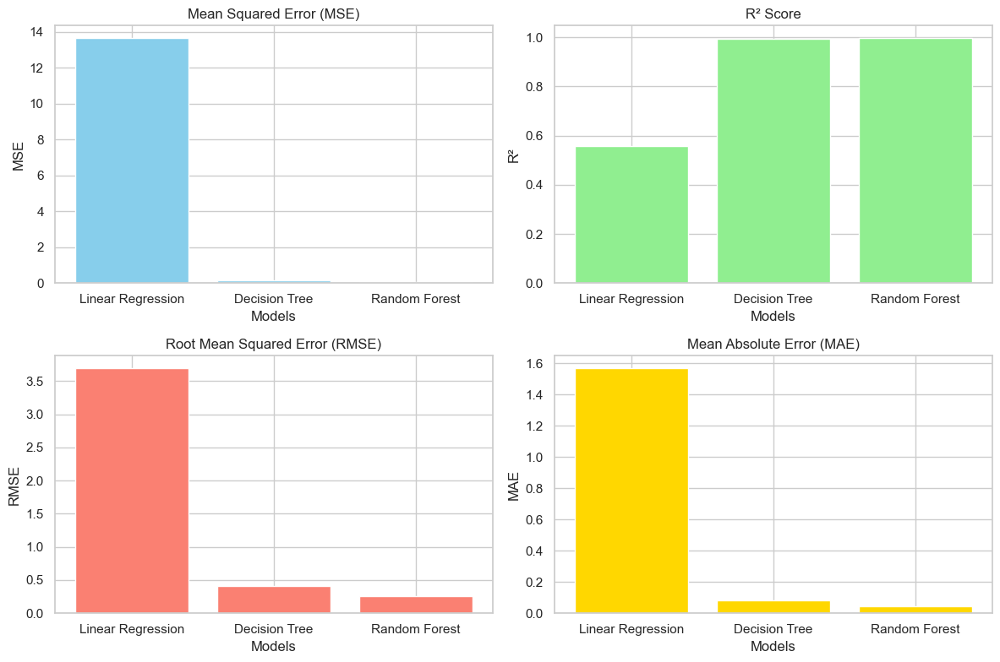

In [73]:
# Dados das métricas
models = ['Linear Regression', 'Decision Tree', 'Random Forest']
mse_values = [mse_lr, mse_dt, mse_rf]
r2_values = [r2_score, r2_score_dt, r2_score_rf]
rmse_values = [rmse_lr, rmse_dt, rmse_rf]
mae_values = [mae_lr, mae_dt, mae_rf]

# Gráfico de Barras para o MSE
plt.figure(figsize=(12, 8))
plt.subplot(221)
plt.bar(models, mse_values, color='skyblue')
plt.title('Mean Squared Error (MSE)')
plt.xlabel('Models')
plt.ylabel('MSE')

# Gráfico de Barras para o R²
plt.subplot(222)
plt.bar(models, r2_values, color='lightgreen')
plt.title('R² Score')
plt.xlabel('Models')
plt.ylabel('R²')

# Gráfico de Barras para o RMSE
plt.subplot(223)
plt.bar(models, rmse_values, color='salmon')
plt.title('Root Mean Squared Error (RMSE)')
plt.xlabel('Models')
plt.ylabel('RMSE')

# Gráfico de Barras para o MAE
plt.subplot(224)
plt.bar(models, mae_values, color='gold')
plt.title('Mean Absolute Error (MAE)')
plt.xlabel('Models')
plt.ylabel('MAE')

plt.tight_layout()
plt.show()